# OASIS EDA: Single Datapoint Fed to Model

This notebook loads one subject from the OASIS JPG dataset, shows its shape, and feeds it through the model to produce logits and a training loss.

In [1]:
from __future__ import annotations

import json
import sys
from pathlib import Path

import torch
from omegaconf import OmegaConf


In [2]:
# Resolve repo root and import local modules
repo_root = Path.cwd().resolve().parents[0]
if (repo_root / 'src').exists() and str(repo_root) not in sys.path:
    sys.path.insert(0, str(repo_root))

cfg_path = repo_root / 'configs' / 'baseline' / 'train_2d_oasis.yaml'
cfg = OmegaConf.load(cfg_path)
print(OmegaConf.to_yaml(cfg))


seed: 42
data:
  format: jpg
  root_dir: data/OASIS/jpg_all
  train_dir: data/OASIS/jpg_all/all
  val_dir: data/OASIS/jpg_all/all
  classes:
  - normal
  - alzheimer
  train_ratio: 0.8
  val_ratio: 0.1
  test_ratio: 0.1
  split_file: data/OASIS/jpg_all/split_info/folds.json
  fold_index: 0
  image_size: 224
  batch_size: 1
  num_workers: 8
  randaugment_ops: 2
  randaugment_mag: 9
  num_slices: 120
  strategy: uniform
  val_strategy: uniform
model:
  name: deit2d
  timm_name: deit_base_patch16_224.fb_in1k
  pretrained: true
  num_classes: 2
  in_channels: 1
  image_size: 224
  drop_path_rate: 0.1
  attn_drop_rate: 0.0
  base_features: 64
  head_hidden: 256
  dropout: 0.3
  head_dropout: 0.2
training:
  max_epochs: 256
  lr: 5.0e-05
  weight_decay: 0.05
  label_smoothing: 0.1
  accelerator: gpu
  devices:
  - 2
  precision: 16
  early_stopping:
    enabled: true
    monitor: val/auc_epoch
    mode: max
    patience: 16
    min_delta: 0.0
logging:
  wandb:
    enabled: true
    project: 

In [3]:
# Load split file and pick a single training subject
split_path = repo_root / cfg.data.split_file
split_data = json.loads(split_path.read_text())

if 'folds' in split_data:
    fold_index = int(getattr(cfg.data, 'fold_index', 0))
    fold = split_data['folds'][fold_index]
    train_items = fold['train']
else:
    train_items = split_data['train']

first_subject_id = train_items[0]['subject_id'] if isinstance(train_items[0], dict) else train_items[0]
print('Using subject:', first_subject_id)


Using subject: OAS1_0287_MR1


In [4]:
# Pick 5 random subjects from the same split
import random

subject_ids = [
    (item['subject_id'] if isinstance(item, dict) else item)
    for item in train_items
]
random.seed(42)
sample_subjects = random.sample(subject_ids, k=min(5, len(subject_ids)))
print('Sample subjects:', sample_subjects)


Sample subjects: ['OAS1_0105_MR1', 'OAS1_0281_MR1', 'OAS1_0031_MR1', 'OAS1_0352_MR1', 'OAS1_0080_MR1']


In [5]:
from src.baseline.data import MRIVolumeJPGDataset

dataset = MRIVolumeJPGDataset(
    root_dir=str(repo_root / cfg.data.train_dir),
    classes=list(cfg.data.classes),
    view=getattr(cfg.data, 'jpg_view', 'ax'),
    num_slices=int(cfg.data.num_slices),
    slice_strategy=getattr(cfg.data, 'strategy', 'uniform'),
    image_size=int(cfg.data.image_size),
    augment=False,
    normalize=True,
    subject_ids={first_subject_id},
)

x, y = dataset[0]
print('Input tensor shape (S, C, H, W):', x.shape)
print('Label:', y.item())


Loaded 1 subjects from /data_hdd_16t/duydang/reze/3D-Unet/data/OASIS/jpg_all/all (view=ax)
Input tensor shape (S, C, H, W): torch.Size([120, 1, 224, 224])
Label: 1


Loaded 1 subjects from /data_hdd_16t/duydang/reze/3D-Unet/data/OASIS/jpg_all/all (view=ax)
Saved: /data_hdd_16t/duydang/reze/3D-Unet/outputs/eda_subjects/OAS1_0105_MR1.gif label= 0


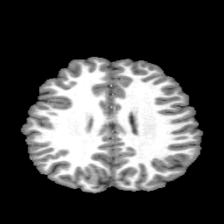

Loaded 1 subjects from /data_hdd_16t/duydang/reze/3D-Unet/data/OASIS/jpg_all/all (view=ax)
Saved: /data_hdd_16t/duydang/reze/3D-Unet/outputs/eda_subjects/OAS1_0281_MR1.gif label= 0


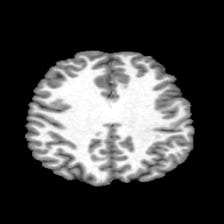

Loaded 1 subjects from /data_hdd_16t/duydang/reze/3D-Unet/data/OASIS/jpg_all/all (view=ax)
Saved: /data_hdd_16t/duydang/reze/3D-Unet/outputs/eda_subjects/OAS1_0031_MR1.gif label= 1


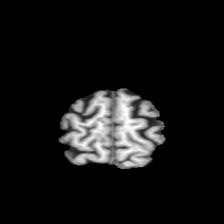

Loaded 1 subjects from /data_hdd_16t/duydang/reze/3D-Unet/data/OASIS/jpg_all/all (view=ax)
Saved: /data_hdd_16t/duydang/reze/3D-Unet/outputs/eda_subjects/OAS1_0352_MR1.gif label= 1


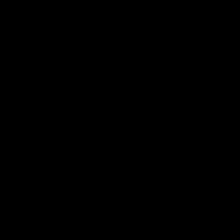

Loaded 1 subjects from /data_hdd_16t/duydang/reze/3D-Unet/data/OASIS/jpg_all/all (view=ax)
Saved: /data_hdd_16t/duydang/reze/3D-Unet/outputs/eda_subjects/OAS1_0080_MR1.gif label= 0


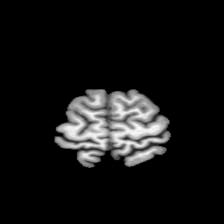

In [6]:
# Create GIFs for 5 sample subjects (rotate back)
import numpy as np
import imageio.v2 as imageio
from IPython.display import Image, display

from src.baseline.data import MRIVolumeJPGDataset

out_dir = repo_root / 'outputs' / 'eda_subjects'
out_dir.mkdir(parents=True, exist_ok=True)

rotate_k = 3  # reverse the preprocessing rot90

for subject_id in sample_subjects:
    dataset = MRIVolumeJPGDataset(
        root_dir=str(repo_root / cfg.data.train_dir),
        classes=list(cfg.data.classes),
        view=getattr(cfg.data, 'jpg_view', 'ax'),
        num_slices=int(cfg.data.num_slices),
        slice_strategy=getattr(cfg.data, 'strategy', 'uniform'),
        image_size=int(cfg.data.image_size),
        augment=False,
        normalize=True,
        subject_ids={subject_id},
    )
    x, y = dataset[0]

    frames = []
    for i in range(x.shape[0]):
        arr = x[i, 0].numpy()
        if rotate_k:
            arr = np.rot90(arr, k=rotate_k)
        vmin, vmax = float(arr.min()), float(arr.max())
        if vmax > vmin:
            arr = (arr - vmin) / (vmax - vmin)
        arr = (arr * 255.0).clip(0, 255).astype(np.uint8)
        frames.append(arr)

    out_path = out_dir / f'{subject_id}.gif'
    imageio.mimsave(out_path, frames, duration=0.08)
    print('Saved:', out_path, 'label=', int(y))
    display(Image(filename=str(out_path)))
